In [1]:
#https://github.com/ava-orange-education/Mastering-Computer-Vision-with-PyTorch-2.0 

In [ ]:
'''
# --- 1. GEOMETRIC TRANSFORMATIONS ---
CenterCrop(size)                # Crops the image at the center.
FiveCrop(size)                  # Crops the image into four corners and the central crop.
TenCrop(size, vertical_flip)    # Crops the image into 10 views (FiveCrop + flipped versions).
Pad(padding, fill, padding_mode)# Pads the given image on all sides.
RandomAffine(degrees, ...)      # Random affine transformation of the image keeping center invariant.
RandomCrop(size, padding, ...)  # Crops the image at a random location.
RandomHorizontalFlip(p)         # Horizontally flips the image randomly with a given probability.
RandomVerticalFlip(p)           # Vertically flips the image randomly with a given probability.
RandomPerspective(distortion, p)# Performs a random perspective transformation of the image.
RandomResizedCrop(size, scale)  # Crops a random portion of the image and resizes it to a given size.
RandomRotation(degrees, ...)    # Rotates the image by a random angle.
Resize(size, interpolation, ...)# Resizes the input image to the given size.

# --- 2. COLOR & FILTER TRANSFORMATIONS ---
ColorJitter(brightness, ...)    # Randomly changes the brightness, contrast, saturation and hue.
GaussianBlur(kernel_size, sigma)# Blurs the image using a Gaussian filter.
Grayscale(num_output_channels)  # Converts image to grayscale.
RandomGrayscale(p)              # Randomly converts image to grayscale with a probability.
RandomInvert(p)                 # Inverts the colors of the image randomly with a probability.
RandomPosterize(bits, p)        # Posterizes the image randomly by reducing the number of bits.
RandomSolarize(threshold, p)    # Solarizes the image randomly by inverting values above a threshold.
RandomAdjustSharpness(sharpness, p) # Adjusts the sharpness of the image randomly.
RandomAutocontrast(p)           # Maximizes the contrast of the image randomly.
RandomEqualize(p)               # Equalizes the histogram of the image randomly.

# --- 3. CONVERSION TRANSFORMATIONS ---
ToPILImage(mode)                # Converts a tensor or an ndarray to a PIL Image.
ToTensor()                      # Converts a PIL Image or numpy.ndarray to a tensor.
PILToTensor()                   # Converts a PIL Image to a tensor of the same type.

# --- 4. GENERIC & COMPOSITION TRANSFORMATIONS ---
Compose(transforms)             # Composes several transforms together in a sequence.
Lambda(lambd)                   # Applies a user-defined function as a transform.
RandomApply(transforms, p)      # Applies a list of transformations randomly with a probability.
RandomChoice(transforms)        # Applies a single transformation randomly picked from a list.
RandomOrder(transforms)         # Applies a list of transformations in a random order.

# --- 5. TENSOR-ONLY TRANSFORMATIONS ---
LinearTransformation(matrix, ..)# Transforms a tensor image with a square transformation matrix.
Normalize(mean, std, inplace)   # Normalizes a float tensor image with mean and standard deviation.
RandomErasing(p, scale, ratio)  # Randomly selects a rectangle region in a tensor image and erases it.
ConvertImageDtype(dtype)        # Converts a tensor image to the given dtype and scales values accordingly.

# --- 6. FUNCTIONAL TRANSFORMS (Usually imported as F) ---
# Note: These are the underlying functions used by the classes above.
# Examples: F.adjust_brightness, F.affine, F.crop, F.erase, F.hflip, F.vflip, F.rotate, etc.
'''

1. GEOMETRIC TRANSFORMATIONS

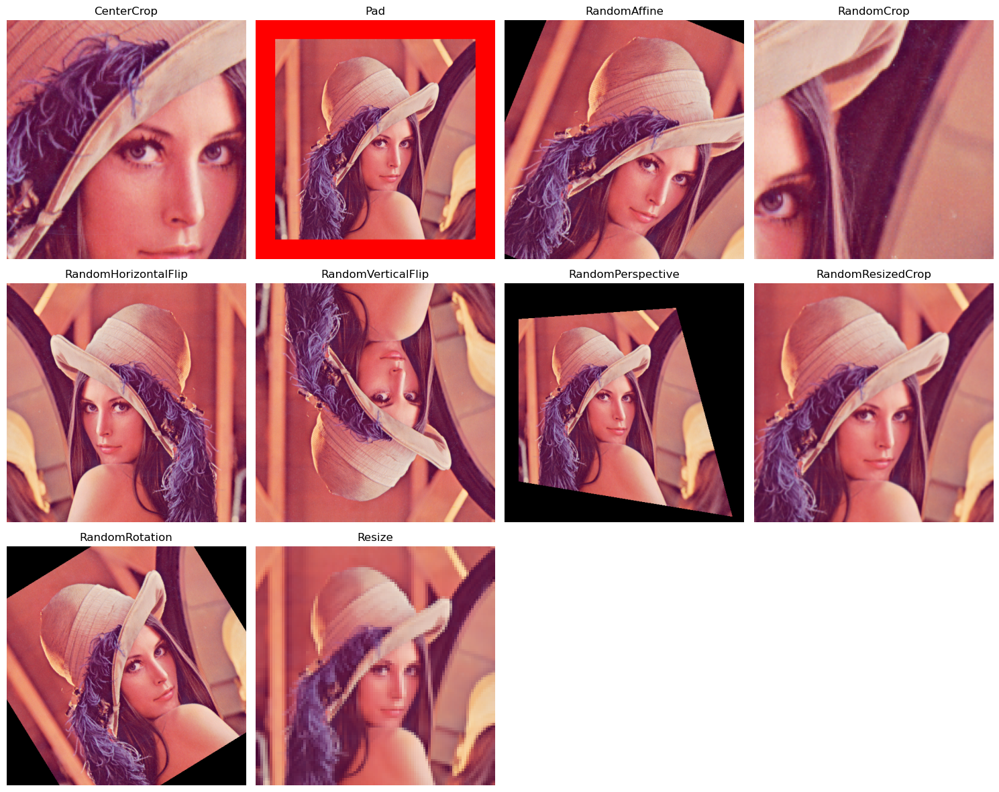

In [3]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

# 1. Load the input image
img_path = 'images/lenna.png'
img = Image.open(img_path).convert('RGB')

# 2. Define the transformations
# We set p=1.0 for random transforms to ensure they trigger for this demo
geometric_transforms = {
    "CenterCrop": transforms.CenterCrop(size=200),
    "Pad": transforms.Pad(padding=50, fill=(255, 0, 0)), # Red padding
    "RandomAffine": transforms.RandomAffine(degrees=30, translate=(0.1, 0.1), scale=(0.8, 1.2)),
    "RandomCrop": transforms.RandomCrop(size=150),
    "RandomHorizontalFlip": transforms.RandomHorizontalFlip(p=1.0),
    "RandomVerticalFlip": transforms.RandomVerticalFlip(p=1.0),
    "RandomPerspective": transforms.RandomPerspective(distortion_scale=0.6, p=1.0),
    "RandomResizedCrop": transforms.RandomResizedCrop(size=(224, 224)),
    "RandomRotation": transforms.RandomRotation(degrees=90),
    "Resize": transforms.Resize(size=(100, 100))
}

# 3. Apply and Visualize
fig = plt.figure(figsize=(15, 12))
keys = list(geometric_transforms.keys())

for i, name in enumerate(keys):
    transform = geometric_transforms[name]
    out = transform(img)
    
    # Handle the multi-image output of FiveCrop and TenCrop
    if isinstance(out, tuple):
        # We just take the first image of the crop set for the grid display
        display_img = out[0]
        title = f"{name} (1 of {len(out)})"
    else:
        display_img = out
        title = name

    ax = fig.add_subplot(3, 4, i + 1)
    ax.set_title(title)
    plt.imshow(display_img)
    plt.axis("off")

plt.tight_layout()
plt.show()

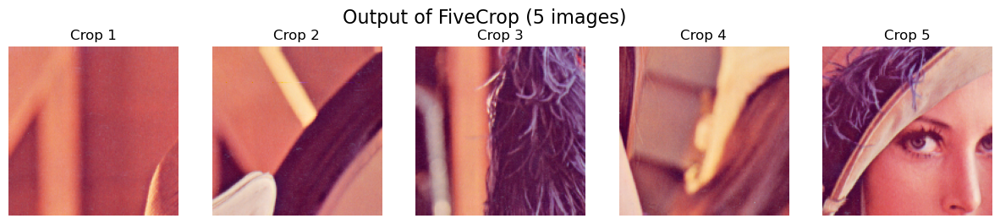

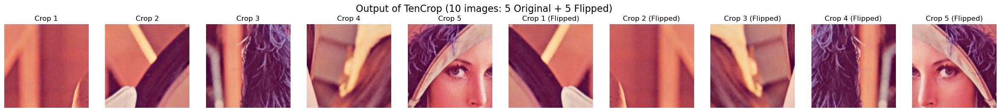

In [5]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

# Load image
img = Image.open('images/lenna.png').convert('RGB')
crop_size = 150

# 1. FiveCrop (Returns a tuple of 5 images)
five_crop = transforms.FiveCrop(size=crop_size)
five_crops = five_crop(img) # (TL, TR, BL, BR, Center)

# 2. TenCrop (Returns a tuple of 10 images: 5 original + 5 flipped)
ten_crop = transforms.TenCrop(size=crop_size, vertical_flip=False) # horizontal flip is default
ten_crops = ten_crop(img)

# --- VISUALIZATION ---

def plot_crops(crops, title):
    n = len(crops)
    fig, axes = plt.subplots(1, n, figsize=(n * 3, 3))
    fig.suptitle(title, fontsize=16)
    
    for i in range(n):
        axes[i].imshow(crops[i])
        axes[i].axis('off')
        # Simple labeling for TenCrop (first 5 original, next 5 flipped)
        if n == 10 and i >= 5:
            axes[i].set_title(f"Crop {i-4} (Flipped)")
        else:
            axes[i].set_title(f"Crop {i+1}")
            
    plt.show()

# Display all 5 from FiveCrop
plot_crops(five_crops, "Output of FiveCrop (5 images)")

# Display all 10 from TenCrop
plot_crops(ten_crops, "Output of TenCrop (10 images: 5 Original + 5 Flipped)")

2. COLOR & FILTER TRANSFORMATIONS

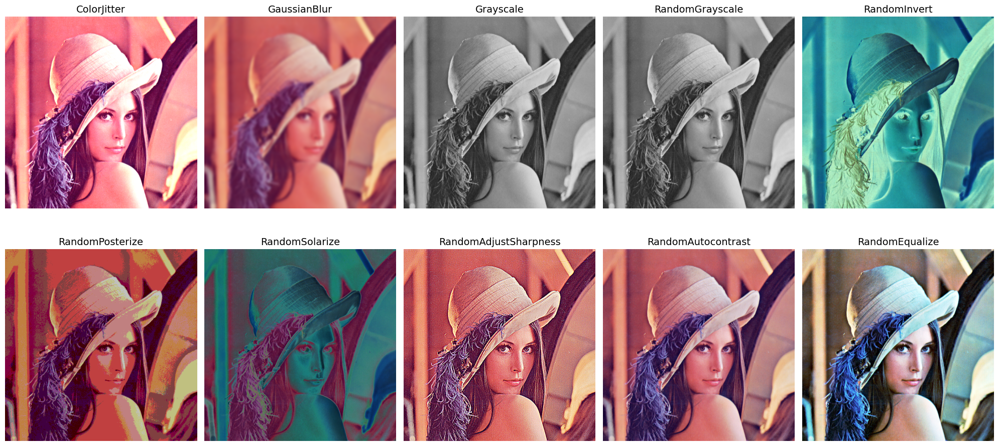

In [6]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

# 1. Load the input image
img_path = 'images/lenna.png'
img = Image.open(img_path).convert('RGB')

# 2. Define the transformations
color_transforms = {
    "ColorJitter": transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.2),
    "GaussianBlur": transforms.GaussianBlur(kernel_size=(15, 15), sigma=(2, 5)),
    "Grayscale": transforms.Grayscale(num_output_channels=3),
    "RandomGrayscale": transforms.RandomGrayscale(p=1.0),
    "RandomInvert": transforms.RandomInvert(p=1.0),
    "RandomPosterize": transforms.RandomPosterize(bits=2, p=1.0),
    "RandomSolarize": transforms.RandomSolarize(threshold=128, p=1.0),
    "RandomAdjustSharpness": transforms.RandomAdjustSharpness(sharpness_factor=10, p=1.0),
    "RandomAutocontrast": transforms.RandomAutocontrast(p=1.0),
    "RandomEqualize": transforms.RandomEqualize(p=1.0)
}

# 3. Apply and Visualize
fig = plt.figure(figsize=(20, 10))
keys = list(color_transforms.keys())

for i, name in enumerate(keys):
    transform = color_transforms[name]
    # Apply the transform
    out_img = transform(img)
    
    # Add to plot
    ax = fig.add_subplot(2, 5, i + 1)
    ax.set_title(name, fontsize=14)
    plt.imshow(out_img)
    plt.axis("off")

plt.tight_layout()
plt.show()

3. CONVERSION TRANSFORMATIONS

In [8]:
import torch
from torchvision import transforms
from PIL import Image
import numpy as np

# Load the input image
img_path = 'images/lenna.png'
img = Image.open(img_path).convert('RGB')

# 1. PILToTensor()
# Converts PIL Image to a torch.Tensor of type uint8 (0-255)
# Note: It does NOT scale the values to [0, 1].
pil_to_tensor_tr = transforms.PILToTensor()
tensor_uint8 = pil_to_tensor_tr(img)

# 2. ToTensor()
# Converts PIL Image or numpy.ndarray to a torch.Tensor
# Note: It automatically scales values from [0, 255] to [0.0, 1.0] 
# and changes shape from (H, W, C) to (C, H, W).
to_tensor_tr = transforms.ToTensor()
tensor_float = to_tensor_tr(img)

# 3. ToPILImage(mode=None)
# Converts a torch.Tensor or numpy.ndarray back to a PIL Image.
to_pil_tr = transforms.ToPILImage()
pil_back = to_pil_tr(tensor_float)

# --- Outputting the results to see the difference ---

print("--- Data Format Comparison ---")
print(f"Original PIL Size: {img.size}") # (Width, Height)

print(f"\nPILToTensor Output:")
print(f"Shape: {tensor_uint8.shape}")   # [Channels, Height, Width]
print(f"Dtype: {tensor_uint8.dtype}")   # torch.uint8
print(f"Max Value: {tensor_uint8.max()}") # 255

print(f"\nToTensor Output:")
print(f"Shape: {tensor_float.shape}")   # [Channels, Height, Width]
print(f"Dtype: {tensor_float.dtype}")   # torch.float32
print(f"Max Value: {tensor_float.max()}") # 1.0 (scaled!)

print(f"\nToPILImage Output:")
print(f"Type: {type(pil_back)}")        # PIL.Image.Image
print(f"Size: {pil_back.size}")         # (Width, Height)

# Visualizing the final conversion back to PIL
pil_back.show()

--- Data Format Comparison ---
Original PIL Size: (512, 512)

PILToTensor Output:
Shape: torch.Size([3, 512, 512])
Dtype: torch.uint8
Max Value: 255

ToTensor Output:
Shape: torch.Size([3, 512, 512])
Dtype: torch.float32
Max Value: 1.0

ToPILImage Output:
Type: <class 'PIL.Image.Image'>
Size: (512, 512)


kf.service.services: KApplicationTrader: mimeType "x-scheme-handler/file" not found
kf.i18n.kuit: "Unknown subcue ':whatsthis,' in UI marker in context {@info:whatsthis, %1 the action's text}."
org.kde.kdegraphics.gwenview.lib: Unresolved mime type  "image/x-aptus-mos"
org.kde.kdegraphics.gwenview.lib: Unresolved mime type  "image/x-arq"
org.kde.kdegraphics.gwenview.lib: Unresolved mime type  "image/x-bay"
org.kde.kdegraphics.gwenview.lib: Unresolved mime type  "image/x-bmq"
org.kde.kdegraphics.gwenview.lib: Unresolved mime type  "image/x-cap"
org.kde.kdegraphics.gwenview.lib: Unresolved mime type  "image/x-cine"
org.kde.kdegraphics.gwenview.lib: Unresolved mime type  "image/x-cs1"
org.kde.kdegraphics.gwenview.lib: Unresolved mime type  "image/x-dc2"
org.kde.kdegraphics.gwenview.lib: Unresolved mime type  "image/x-drf"
org.kde.kdegraphics.gwenview.lib: Unresolved mime type  "image/x-dxo"
org.kde.kdegraphics.gwenview.lib: Unresolved mime type  "image/x-epson-eip"
org.kde.kdegraphics.gwe

4. GENERIC & COMPOSITION TRANSFORMATIONS

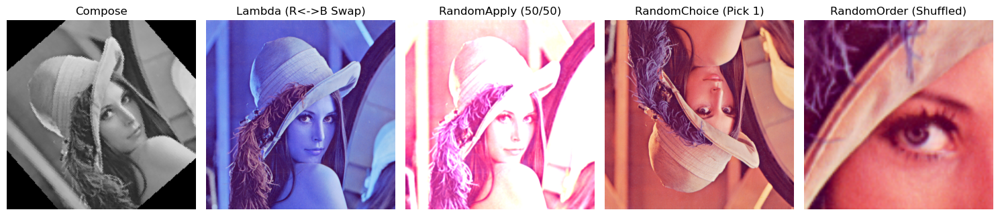

In [9]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

# Load image
img_path = 'images/lenna.png'
img = Image.open(img_path).convert('RGB')

# 1. Compose: Chains transforms in a fixed sequence
# First resize, then turn to grayscale, then rotate.
compose_tr = transforms.Compose([
    transforms.Resize((200, 200)),
    transforms.Grayscale(num_output_channels=3),
    transforms.RandomRotation(degrees=45)
])

# 2. Lambda: Apply a custom function (e.g., manual color channel swap)
# Here we swap Red and Blue channels manually
lambda_tr = transforms.Lambda(lambda x: Image.merge("RGB", (x.split()[2], x.split()[1], x.split()[0])))

# 3. RandomApply: Applies a group of transforms only with a certain probability
# There is a 50% chance the image will be blurred AND jittered.
random_apply_tr = transforms.RandomApply([
    transforms.GaussianBlur(kernel_size=5),
    transforms.ColorJitter(brightness=2)
], p=0.5)

# 4. RandomChoice: Randomly picks ONLY ONE transform from the list
random_choice_tr = transforms.RandomChoice([
    transforms.RandomHorizontalFlip(p=1.0),
    transforms.RandomVerticalFlip(p=1.0),
    transforms.RandomRotation(degrees=90)
])

# 5. RandomOrder: Applies all transforms in the list, but in a random sequence
# Sequential order matters (e.g., Crop then Resize vs Resize then Crop)
random_order_tr = transforms.RandomOrder([
    transforms.CenterCrop(100),
    transforms.ColorJitter(contrast=2),
    transforms.Resize((256, 256))
])

# --- Execution and Visualization ---
logic_transforms = {
    "Compose": compose_tr,
    "Lambda (R<->B Swap)": lambda_tr,
    "RandomApply (50/50)": random_apply_tr,
    "RandomChoice (Pick 1)": random_choice_tr,
    "RandomOrder (Shuffled)": random_order_tr
}

fig = plt.figure(figsize=(15, 8))
for i, (name, transform) in enumerate(logic_transforms.items()):
    out_img = transform(img)
    ax = fig.add_subplot(1, 5, i + 1)
    ax.set_title(name)
    plt.imshow(out_img)
    plt.axis("off")

plt.tight_layout()
plt.show()

5. TENSOR-ONLY TRANSFORMATIONS 

In [12]:
import torch
from torchvision import transforms
from PIL import Image

img = Image.open('images/lenna.png').convert('RGB')

# 1. Define the multi-crop transform
five_crop = transforms.FiveCrop(size=100)

# 2. Define the transformation you want to apply to EACH crop
# We use a Lambda to loop through the tuple returned by FiveCrop
transform_pipeline = transforms.Compose([
    five_crop,
    transforms.Lambda(lambda crops: torch.stack([transforms.ToTensor()(crop) for crop in crops]))
])

# This now returns a 4D Tensor: [5, 3, 100, 100] 
# (Number of crops, Channels, Height, Width)
output_tensor = transform_pipeline(img)

print(f"Output shape: {output_tensor.shape}") 
# Result: torch.Size([5, 3, 100, 100])

Output shape: torch.Size([5, 3, 100, 100])


6. FUNCTIONAL TRANSFORMS

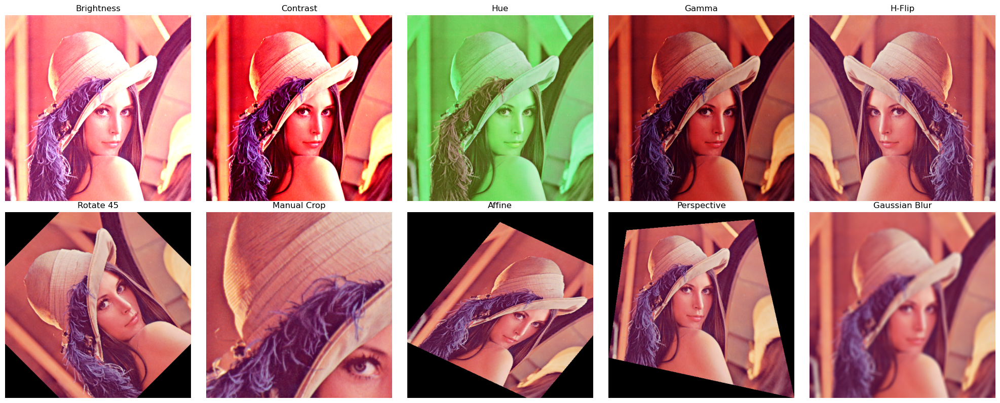

In [15]:
'''
# --- 6. FUNCTIONAL TRANSFORMS ---
# These functions give you direct control over the transformation parameters.
# Standard import: import torchvision.transforms.functional as F
'''

import torch
import torchvision.transforms.functional as F
from PIL import Image
import matplotlib.pyplot as plt

# Load image
img = Image.open('images/lenna.png').convert('RGB')

# 1. Adjustments (Brightness, Contrast, Saturation, Hue)
# Factor 1.0 is original image. 0.0 is black/gray. 2.0 is double intensity.
img_bright = F.adjust_brightness(img, brightness_factor=1.5)
img_contrast = F.adjust_contrast(img, contrast_factor=2.0)
img_hue = F.adjust_hue(img, hue_factor=0.3) # Range [-0.5, 0.5]
img_gamma = F.adjust_gamma(img, gamma=2.0, gain=1.0)

# 2. Geometric (Manual Control)
# hflip/vflip are simple booleans (no probability here, it just does it)
img_hflip = F.hflip(img)
img_vflip = F.vflip(img)

# Rotate: You specify the exact angle
img_rotate = F.rotate(img, angle=45, fill=[0, 0, 0])

# Crop: (img, top, left, height, width)
img_crop = F.crop(img, top=100, left=100, height=200, width=200)

# Affine: (img, angle, translate, scale, shear)
img_affine = F.affine(img, angle=30, translate=[50, 20], scale=0.8, shear=[10, 5])

# Perspective: Requires 4 start points and 4 end points
start_points = [[0, 0], [511, 0], [511, 511], [0, 511]]
end_points = [[50, 50], [400, 20], [511, 511], [0, 400]]
img_persp = F.perspective(img, start_points, end_points)

# 3. Filter & Tensor Ops
# Gaussian Blur: (img, kernel_size, sigma)
img_blur = F.gaussian_blur(img, kernel_size=[11, 11], sigma=[5.0, 5.0])

# Erase: (Requires Tensor input)
img_tensor = F.to_tensor(img)
img_erased = F.erase(img_tensor, i=100, j=100, h=100, w=100, v=0)

# --- Visualization ---
func_results = {
    "Brightness": img_bright,
    "Contrast": img_contrast,
    "Hue": img_hue,
    "Gamma": img_gamma,
    "H-Flip": img_hflip,
    "Rotate 45": img_rotate,
    "Manual Crop": img_crop,
    "Affine": img_affine,
    "Perspective": img_persp,
    "Gaussian Blur": img_blur
}

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

for i, (title, out) in enumerate(func_results.items()):
    axes[i].imshow(out)
    axes[i].set_title(title)
    axes[i].axis('off')

plt.tight_layout()
plt.show()